# Modelo de Reconocimiento de Imágenes

El reconocimiento de imágenes 🖼️ es una de las aplicaciones más fascinantes dentro del _machine learning_ 🤖.

Mediante el uso de **redes neuronales**, específicamente a las redes neuronales convolucionales (_CNNs_, por sus siglas en inglés) 🧠, podemos enseñar a la computadora a ver, comprender el contenido visual 📸 y en algunos casos, **generar** nuevas imágenes.

En este proyecto, exploraremos cómo crear, entrenar y probar un modelo CNN para el reconocimiento de imágenes de diversos objetos 🚀. 

Para ello, utilizaremos la librería `TensorFlow` 🧠, que nos permitirá construir y entrenar el modelo, librerías para tratamiento de imágenes como `cv2` 📸, además de librerías estadísticas y matemáticas como `NumPy` 📊 y `Math` ➗.

Respecto de la información 📚, nos apoyaremos en las bases de datos disponibles en la web de documentaciones de `TensorFlow` 🌐. Para este proyecto, utilizaremos una base de imágenes 🖼️ de distintos objetos, incluyendo animales 🐾, vehículos 🚗 y objetos variados 🎒.

## Librerías

In [1]:
# Librerías para Modelamiento e Información
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow import keras

# Librerías de Apoyo
import numpy as np
import math

# Librerías Gráficas
import matplotlib.pyplot as plt

## Descarga de Datos

La base de datos `stl10`, contiene imágenes de múltiples objetos.

Los **datos** como tal corresponden a las imágenes y la **metadata** hace referencia a las características del conjunto de datos.

In [2]:
# Descarga de la información y exploración de la metadata
data, metadata = tfds.load('stl10', as_supervised = True, with_info = True)
print(metadata)

tfds.core.DatasetInfo(
    name='stl10',
    full_name='stl10/1.0.0',
    description="""
    The STL-10 dataset is an image recognition dataset for developing unsupervised
    feature learning, deep learning, self-taught learning algorithms. It is inspired
    by the CIFAR-10 dataset but with some modifications. In particular, each class
    has fewer labeled training examples than in CIFAR-10, but a very large set of
    unlabeled examples is provided to learn image models prior to supervised
    training. The primary challenge is to make use of the unlabeled data (which
    comes from a similar but different distribution from the labeled data) to build
    a useful prior. All images were acquired from labeled examples on ImageNet.
    """,
    homepage='http://ai.stanford.edu/~acoates/stl10/',
    data_dir='C:\\Users\\ryanh\\tensorflow_datasets\\stl10\\1.0.0',
    file_format=tfrecord,
    download_size=Unknown size,
    dataset_size=1.86 GiB,
    features=FeaturesDict({
        'im

Dentro de la metadata, encontramos tres secciones:
 - `Test`: Correspondiente a la información de prueba que usará el modelo para validar su eficiencia.
 - `Train`: Correspondiente a la información que usará el modelo para aprender.
 - `Unlabelled`: Utilizada para realizar pruebas posteriores.

## Asignación de Bloques de Entrenamiento y Prueba

In [3]:
# División de la información para entrenamiento y prueba
train, test = data['train'], data['test']

In [4]:
# Etiquetas asigadas a la información disponible
classes = metadata.features['label'].names
print(classes)

['airplane', 'bird', 'car', 'cat', 'deer', 'dog', 'horse', 'monkey', 'ship', 'truck']


## Exploración y Normalización de la Información

Cuando nosotros trabajamos con algoritmos e imágenes 🖼️, podemos entender la imagen como un conjunto de pequeños cuadrados 🔲. A estos cuadros se les denomina **pixeles**.

Cada uno de estos píxeles 🔲 cuenta con características definidas que le dan vida y sentido 🌈.

Por ejemplo, en esta imagen 📷:

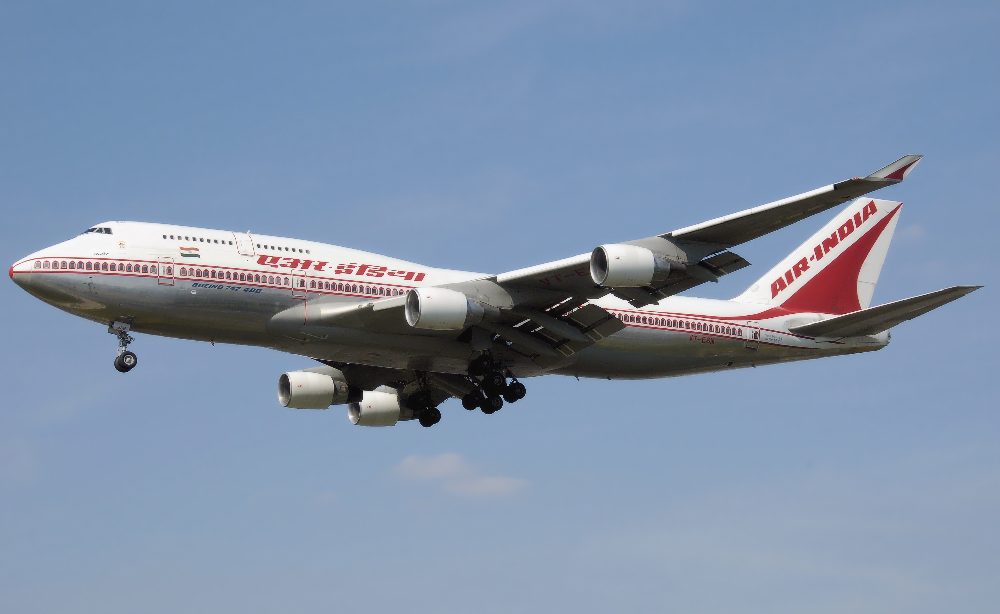

🎨 Normalmente, el color de un píxel 🔲 viene dado por **tres parámetros clave**:

 - 🔴 Rojo
 - 🔵 Azul
 - 🟢 Verde

Estos tres colores (que, por cierto, son los colores primarios 🌈) combinados le otorgan a cada píxel su **coloración característica** 🖌️ y pueden tomar valores entre 0 y 255.

Ahora, si bien es cierto que la mezcla de los valores de estos tres parámetros 🔴🔵🟢 le da vida a una imagen 🖼️, podemos incluir un cuarto parámetro que suele pasar desapercibido: la opacidad 🌫️.

La opacidad de una imagen viene dada por un parámetro llamado `alpha` 🅰️. Este toma valores entre 0 (completamente transparente) y 1 (completamente opaco) ⚖️, definiendo su nivel de transparencia 📏.

Como se está trabajando con una gran cantidad de imágenes 🖼️, el principal interés es generar la máxima eficiencia ⚡ durante la ejecución de la red neuronal 🧠.
A través de la función `tf.cast()` en `TensorFlow` 🤖, se puede "re-escalar" la información 🔄 para que la red sea mucho más fácil de ejecutar y entender 🖥️.
En este caso, se opta por convertir una escala numérica de 0-255 🔢 a una escala entre 0-1 🔟, utilizando el proceso de normalización. Esto simplifica el análisis y mejora el rendimiento del modelo 🚀.

In [5]:
# Funcion de normalizacion para los datos (Re-escala de 0-255 a 0-1)
def normalizar(imagenes, etiquetas):
  imagenes = tf.cast(imagenes, tf.float32)
  imagenes = imagenes / 255
  return imagenes, etiquetas

# Se aplica la configuración a todos los registros de prueba y entrenamiento
train = train.map(normalizar)
test = test.map(normalizar)

Nota: Esta sentencia tiene sentido de ser si es que este notebook se está ejecutando en **Google Colaboratory** 😅 o algún entorno _cloud_ ☁️.

Aquí lo que se busca es maximizar la velocidad de ejecución mediante el almacenamiento de la información en la _RAM_ de la computadora 🖥️.

In [6]:
# Agilización de almacenado
train = train.cache()
train = train.cache()

## Caracterización de una Imagen

Lo anterior corresponde al análisis de un solo píxel 🔲. Sin embargo, una imagen 🖼️ contiene **miles** de estos 😭.

Aquí es donde entra el concepto de **tensor** 📐 (y de ahí lo de `TensorFlow` 😅).
Entendámoslo en sencillo 😊...

Una imagen contiene dos elementos principales:
 - 📏 Altura
 - 🧭 Anchura
A estos dos elementos, se les añade uno más, que corresponde al color 🌈 de la imagen. Este viene dado por los tres (o cuatro) valores que constituyen el color de los píxeles.

Así, para una imagen de _96 x 96_ 📸, se disponen de 9216 píxeles 🔲, que a su vez cuentan con tres valores para el RGB 🔴🔵🟢 que se comentó anteriormente.

La función del tensor, es agrupar estos datos y mediante ellos, transforma la imagen de un conjunto de píxeles a un conjunto de datos numéricos 🔢, los cuales la computadora puede entender 🤖 y, de esa forma, empezar a categorizar 🏷️.

In [7]:
# Ejemplo Textual
for i, (imagen, etiqueta) in enumerate(train.take(2)):
    print(imagen, etiqueta)

tf.Tensor(
[[[0.53333336 0.5647059  0.6       ]
  [0.49019608 0.49803922 0.53333336]
  [0.49019608 0.49411765 0.50980395]
  ...
  [0.38431373 0.3882353  0.38431373]
  [0.35686275 0.37254903 0.38039216]
  [0.32941177 0.3647059  0.3882353 ]]

 [[0.5411765  0.5254902  0.5294118 ]
  [0.45490196 0.42745098 0.3882353 ]
  [0.43529412 0.41960785 0.38431373]
  ...
  [0.4627451  0.4745098  0.46666667]
  [0.4627451  0.4862745  0.49411765]
  [0.38039216 0.4117647  0.43137255]]

 [[0.5058824  0.5058824  0.47843137]
  [0.43529412 0.42745098 0.3882353 ]
  [0.49803922 0.49019608 0.47058824]
  ...
  [0.44313726 0.45882353 0.44705883]
  [0.47843137 0.49411765 0.49803922]
  [0.45490196 0.4745098  0.4862745 ]]

 ...

 [[0.5176471  0.5137255  0.47058824]
  [0.5058824  0.49411765 0.46666667]
  [0.4745098  0.45490196 0.43137255]
  ...
  [0.84313726 0.72156864 0.6392157 ]
  [0.7529412  0.5803922  0.5058824 ]
  [0.7764706  0.6862745  0.6156863 ]]

 [[0.5647059  0.5568628  0.5137255 ]
  [0.49803922 0.4862745  0

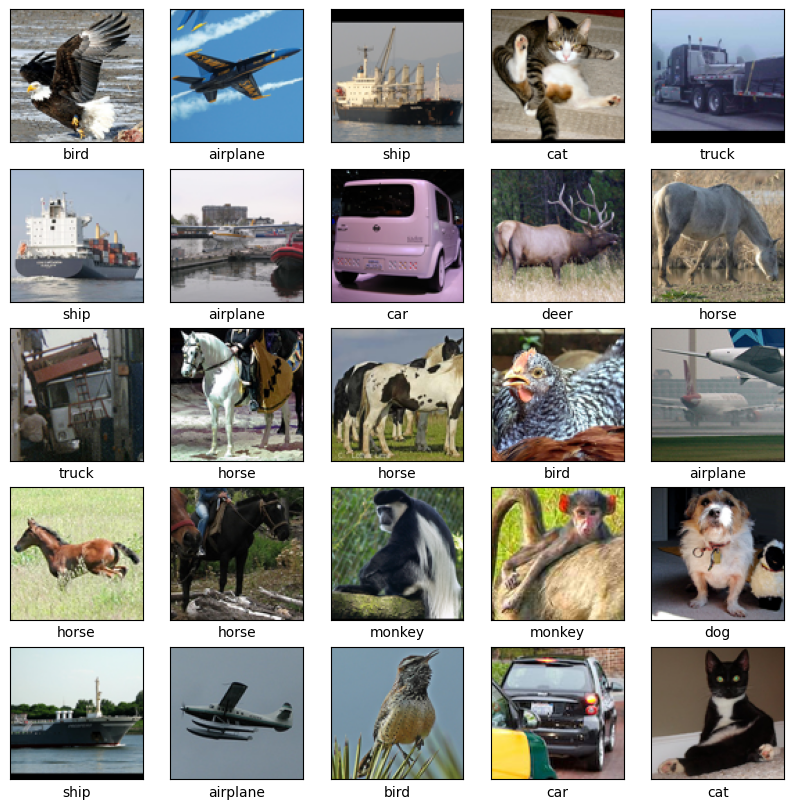

In [8]:
# Ejemplo Gráfico
plt.figure(figsize=(10,10))
for i, (imagen, etiqueta) in enumerate(train.take(25)):
  imagen = imagen.numpy().reshape((96, 96, 3))
  plt.subplot(5,5,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(imagen, cmap = plt.cm.binary)
  plt.xlabel(classes[etiqueta])
plt.show()

## Construcción de la Red

Para entender esta parte del código, exploremos un poco sobre las redes neuronales 🧠.

El cerebro humano tiene la capacidad innata de realizar **dos cosas esenciales**:
 - 🏷️ Categorizar: A través de la comprensión de los objetos que nos rodean 👀.
 - 🔮 Inferir: Predecir eventos futuros basándose en la actualidad y en el pasado ⏳.
Para llevar a cabo estas tareas, contamos con _neuronas_ 🧬. Estas células procesan la información que recibimos a través de estímulos (sensoriales, auditivos, etc.) 💡👂, y nos permiten realizar estas actividades de forma eficiente.

Asimismo, estas neuronas se interconectan entre sí a través de un proceso conocido como __sinapsis__ ⚡, el cual permite la transmisión de la información entre ellas. A través de estas conexiones, el ser humano puede tomar decisiones 🧠💡.


Pues bueno, una red neuronal (programada) funciona exactamente de la misma forma...

🔧 Las especificaciones técnicas son complejas, pero podemos entenderlo en tres puntos clave:

 - 🧠 Las **neuronas de primera línea**, es decir, las que reciben la información para procesar, se agrupan en lo que se conoce como la _capa de entrada_ 📥.

 - 🔄 Una vez que estas neuronas han procesado la información, pasan al siguiente bloque. Estas neuronas constituyen __las capas ocultas__ 🌫️, que permiten afinar el rendimiento de la red 🧠💪.

 - 🎯 Cuando se termina el proceso, los resultados se obtienen de un conjunto de **neuronas de última línea**, que se agrupan en la capa de salida 📤.

Por ejemplo, esta red permite realizar la categorización de imágenes a partir de la información de entrenamiento.

Hay que tomar en cuenta que existen dos puntos clave a tomar en cuenta:
 - Número de Neuronas
 - Factor de Filtro

In [9]:
def modelo_creado(hp1=16, hp2=32, hp3=64, hp4=128):
    modelo = tf.keras.Sequential([
        # Bloque 1
        tf.keras.layers.Conv2D(filters=hp1, kernel_size=(3, 3), input_shape=(96, 96, 3), activation='relu', padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(filters=hp1, kernel_size=(3, 3), activation='relu', padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPool2D(pool_size=(2, 2)),
        tf.keras.layers.Dropout(0.1),

        # Bloque 2
        tf.keras.layers.Conv2D(filters=hp2, kernel_size=(3, 3), activation='relu', padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(filters=hp2, kernel_size=(3, 3), activation='relu', padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPool2D(pool_size=(2, 2)),
        tf.keras.layers.Dropout(0.2),

        # Bloque 3
        tf.keras.layers.Conv2D(filters=hp3, kernel_size=(3, 3), activation='relu', padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(filters=hp3, kernel_size=(3, 3), activation='relu', padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPool2D(pool_size=(2, 2)),
        tf.keras.layers.Dropout(0.3),

        # Bloque 4
        tf.keras.layers.Conv2D(filters=hp4, kernel_size=(3, 3), activation='relu', padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPool2D(pool_size=(2, 2)),

        # Clasificación
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(10, activation='softmax')  # Para 10 clases de salida
    ])
    return modelo

modelo = modelo_creado(hp1=32, hp2=64, hp3=128, hp4=256)

C:\Users\ryanh\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


🔑 En una red neuronal (la más elemental), existen tres elementos clave:

 - ⚖️ Peso de Interacción: Cada neurona se interconecta con las de la capa siguiente. Este peso permite a la red definir qué rutas son las más óptimas para llegar al mejor resultado 🎯.
 - 🔄 Función de Activación: Permite flexibilizar el funcionamiento de la red y realizar tareas más complejas 🧠. Aquí distinguimos tres tipos:
    - 🔺 `Rectificación Lineal (ReLU)`: Redistribuye los pesos dentro de las interacciones con las demás neuronas, dependiendo del valor de entrada de la neurona en cuestión ⚡.
    - 📊 `SoftMax`: Utilizado en la capa de salida 📤, consolida todos los valores como una distribución de probabilidad 🎲, y para todas las neuronas, la suma debe ser igual a 1.
    - 📈 `Sigmoide`: Emula el comportamiento de una curva de aprendizaje convencional 📉, en términos sencillos.

🔑 El tercer elemento clave corresponde a la función de pérdidas ⚖️.

Esta función permite conocer si el modelo es preciso o no 🧐. Bajo esta mirada, el objetivo para todo modelo de esta naturaleza es minimizar el valor de esta función 🏆. Entre los más tradicionales, destacan:
 - 📏 Error Cuadrático Medio (MSE): Calcula la media de los cuadrados de los errores entre los valores predichos y los reales.
 - 🔢 Error Absoluto Medio (MAE): Mide la media de las diferencias absolutas entre los valores predichos y los reales.
 - 🔄 Entropía Cruzada (H): Utilizada principalmente en clasificación, mide la diferencia entre la distribución de probabilidad predicha y la verdadera.

In [10]:
#Compilar el modelo
modelo.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),  # Ajuste fino de learning rate
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),  # Cambia a True si no usas softmax en la salida
    metrics=[
        'accuracy'
    ]
)
modelo.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 96, 96, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 96, 96, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 96, 96, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 96, 96, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 48, 48, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 48, 48, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 48, 48, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 48, 48, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 48, 48, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 48, 48, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 24, 24, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 24, 24, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 24, 24, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 24, 24, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 24, 24, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 24, 24, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 12, 12, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 12, 12, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 6, 6, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 619,178 (2.36 MB)

 Trainable params: 617,770 (2.36 MB)

 Non-trainable params: 1,408 (5.50 KB)

## Entrenamiento del Modelo

In [11]:
# El trabajo por lotes permite que entrenamientos con gran cantidad de datos se haga de manera mas eficiente
batch = 64

# Introducción aleatoria de los datos de ingreso para los lotes
train = train.repeat().shuffle(metadata.splits['train'].num_examples).batch(batch)
test = test.batch(batch)

# Entrenamiento
historial = modelo.fit(train, epochs = 50, steps_per_epoch = math.ceil(metadata.splits['train'].num_examples / batch))

Epoch 1/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 92s 1s/step - accuracy: 0.1782 - loss: 4.3064
Epoch 2/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 88s 1s/step - accuracy: 0.2974 - loss: 3.4915
Epoch 3/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 89s 1s/step - accuracy: 0.3477 - loss: 3.2612
Epoch 4/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 89s 1s/step - accuracy: 0.3689 - loss: 3.1621
Epoch 5/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 87s 1s/step - accuracy: 0.4081 - loss: 3.0178
Epoch 6/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 88s 1s/step - accuracy: 0.4316 - loss: 2.9118
Epoch 7/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 88s 1s/step - accuracy: 0.4475 - loss: 2.8160
Epoch 8/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 88s 1s/step - accuracy: 0.4682 - loss: 2.7342
Epoch 9/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 87s 1s/step - accuracy: 0.4801 - loss: 2.6240
Epoch 10/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 88s 1s/step - accuracy: 0.5244 - loss: 2.5071
Epoch 11/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 87s 1s/step - accuracy: 0.5185 - loss: 2.4564
Epoch 12/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 88s 1s/step - accuracy: 0.5371 - lo

## Cálculo de la Función de Pérdida

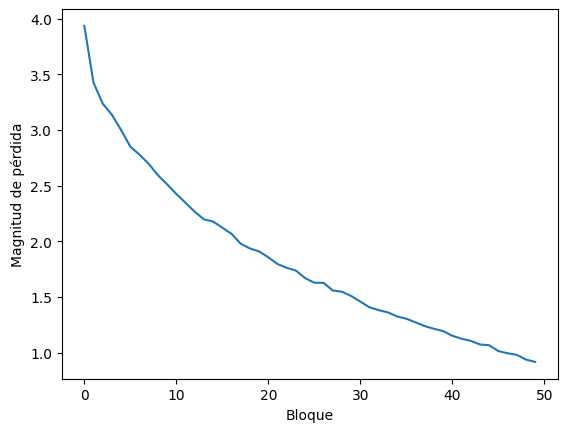

In [12]:
#Ver la funcion de perdida
plt.xlabel("Bloque")
plt.ylabel("Magnitud de pérdida")
plt.plot(historial.history["loss"])

## Probando el Modelo

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


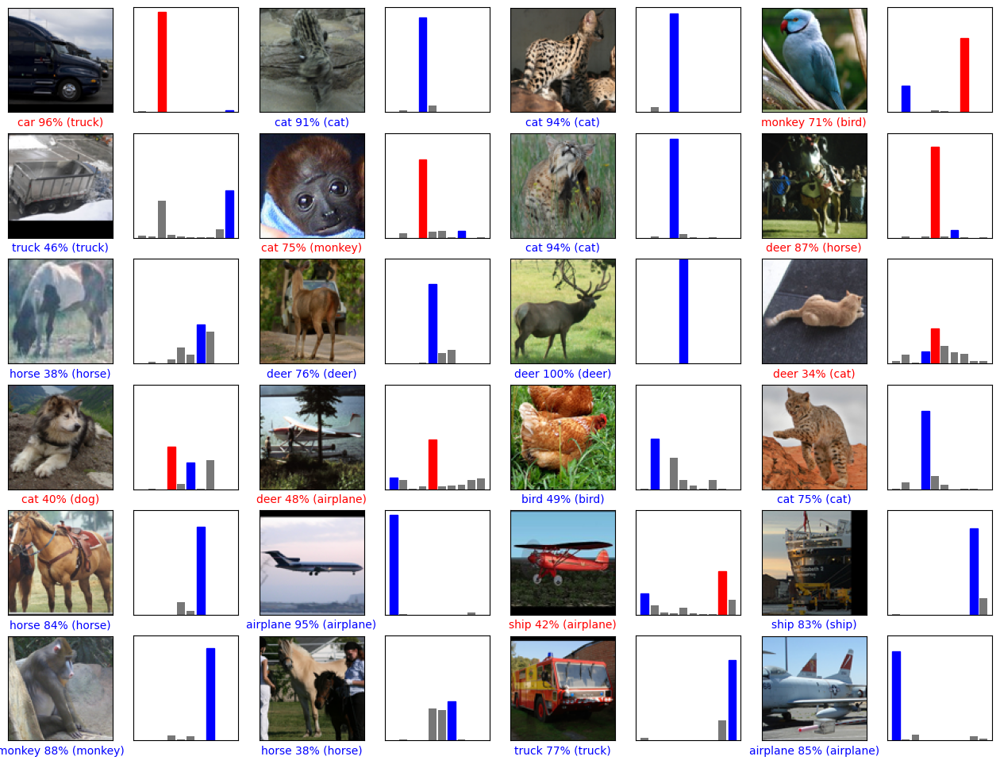

In [13]:
for imagenes_prueba, etiquetas_prueba in test.take(1):
  imagenes_prueba = imagenes_prueba.numpy()
  etiquetas_prueba = etiquetas_prueba.numpy()
  predicciones = modelo.predict(imagenes_prueba)
  
def graficar_imagen(i, arr_predicciones, etiquetas_reales, imagenes):
  arr_predicciones, etiqueta_real, img = arr_predicciones[i], etiquetas_reales[i], imagenes[i]
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  
  plt.imshow(img, cmap=plt.cm.binary)

  etiqueta_prediccion = np.argmax(arr_predicciones)
  if etiqueta_prediccion == etiqueta_real:
    color = 'blue'
  else:
    color = 'red'
  
  plt.xlabel("{} {:2.0f}% ({})".format(classes[etiqueta_prediccion],
                                100*np.max(arr_predicciones),
                                classes[etiqueta_real]),
                                color=color)
  
def graficar_valor_arreglo(i, arr_predicciones, etiqueta_real):
  arr_predicciones, etiqueta_real = arr_predicciones[i], etiqueta_real[i]
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  grafica = plt.bar(range(10), arr_predicciones, color="#777777")
  plt.ylim([0, 1]) 
  etiqueta_prediccion = np.argmax(arr_predicciones)
  
  grafica[etiqueta_prediccion].set_color('red')
  grafica[etiqueta_real].set_color('blue')
  
filas = 6
columnas = 4
num_imagenes = filas*columnas
plt.figure(figsize=(2*2*columnas, 2*filas))
for i in range(num_imagenes):
  try:
    plt.subplot(filas, 2*columnas, 2*i+1)
    graficar_imagen(i, predicciones, etiquetas_prueba, imagenes_prueba)
    plt.subplot(filas, 2*columnas, 2*i+2)
    graficar_valor_arreglo(i, predicciones, etiquetas_prueba)
  except:
    pass